# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px 
from datetime import datetime

# Read Data

In [2]:
df = pd.read_csv('covid_19_data.csv')

# Explor Data

In [3]:
#Show first five rows of data
df.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [4]:
# Information of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306429 entries, 0 to 306428
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   SNo              306429 non-null  int64  
 1   ObservationDate  306429 non-null  object 
 2   Province/State   228329 non-null  object 
 3   Country/Region   306429 non-null  object 
 4   Last Update      306429 non-null  object 
 5   Confirmed        306429 non-null  float64
 6   Deaths           306429 non-null  float64
 7   Recovered        306429 non-null  float64
dtypes: float64(3), int64(1), object(4)
memory usage: 18.7+ MB


In [5]:
df['Province/State'] = df['Province/State'].fillna("Unknown")

In [6]:
df.isnull().sum()

SNo                0
ObservationDate    0
Province/State     0
Country/Region     0
Last Update        0
Confirmed          0
Deaths             0
Recovered          0
dtype: int64

In [7]:
df = df.rename(columns = {"Province/State":"State"})
df = df.rename(columns = {"Country/Region":"Country"})

In [8]:
df[['Confirmed','Deaths','Recovered']] = df[['Confirmed','Deaths','Recovered']].astype(int)

In [9]:
df['Active'] = df['Confirmed']-df['Deaths']-df['Recovered']
df.columns

Index(['SNo', 'ObservationDate', 'State', 'Country', 'Last Update',
       'Confirmed', 'Deaths', 'Recovered', 'Active'],
      dtype='object')

In [10]:
df['Date'] = df['ObservationDate'].copy()

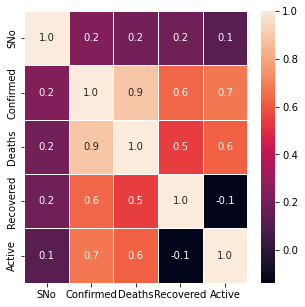

In [11]:
f,ax = plt.subplots(figsize=(5, 5))
sns.heatmap(df.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.show()

In [12]:
value=pd.DataFrame({'Confirmed':sum(df['Confirmed']),'Deaths:':sum(df['Deaths']),'Recovered :':sum(df['Recovered']),'Active':sum(df['Active']) }, index=[0])
value

,Confirmed,Deaths:,Recovered :,Active
0,26252051758,624013017,15450237912,10177800829


# Viuaslize Data

In [13]:
labels = ["Confirmed Cases","Active Cases","Recovered Cases","Death Cases"]
sumconfirmed= sum(df['Confirmed'])
sumactive= sum(df['Active'])
sumrecoverd = sum(df['Recovered'])
sumdeaths = sum(df['Deaths'])

fig = px.pie(df, 
             values = [sumconfirmed,sumactive,sumrecoverd,sumdeaths],
             names = labels,
              color_discrete_sequence=px.colors.sequential.RdBu)
            # color_discrete_sequence = ['Red','SkyBlue','Pink','LightSlateGray'])

fig.update_traces(textposition = 'inside', textinfo = 'percent+label')

fig.update_layout(title = 'The percentage of Covid-19 Cases in the world',
                  title_x = 0.5,
                  title_font= dict(size = 18, color = 'DarkRed' ))

fig.show()


In [14]:
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values("Date")

In [15]:
dftime = df.groupby("Date")[["Confirmed","Active","Recovered","Deaths"]].sum().reset_index()


In [16]:
fig = px.bar(dftime,
             x = 'Date',
             y = 'Confirmed',
             color = 'Confirmed',
             color_continuous_scale = 'amp',
             labels = {"Confirmed":"Confirmed Cases"})

fig.update_layout(title = 'Confirmed Cases - Daily',
                  title_x = 0.5,
                  title_font = dict(size= 18, color = 'Darkred'),
                  xaxis = dict(title = 'Date'),
                  yaxis = dict(title = 'Confirmed Cases'))

In [17]:
fig = px.bar(dftime,
             x = 'Date',
             y = 'Active',
             color = 'Active',
             color_continuous_scale = 'Darkmint',
             labels = {"Active":"Active Cases"})

fig.update_layout(title = 'Active Cases - Daily',
                  title_x = 0.5,
                  title_font = dict(size= 18, color = 'DarkBlue'),
                  xaxis = dict(title = 'Date'),
                  yaxis = dict(title = 'Active Cases'))

fig.show()

In [18]:
fig = px.bar(dftime,
             x = 'Date',
             y = 'Recovered',
             color = 'Recovered',
             color_continuous_scale = 'tempo',
             labels = {"Recovered":"Recovered Cases"})

fig.update_layout(title = 'Recovered Cases - Daily',
                  title_x = 0.5,
                  title_font = dict(size= 18, color = 'DarkGreen'),
                  xaxis = dict(title = 'Date'),
                  yaxis = dict(title = 'Recovered Cases'))

fig.show()

In [19]:
fig = px.bar(dftime,
             x = 'Date',
             y = 'Deaths',
             color = 'Deaths',
             color_continuous_scale = 'Greys',
             labels = {"Deaths":"Death Caaes"})

fig.update_layout(title = 'Death Cases - Daily',
                  title_x = 0.5,
                  title_font = dict(size= 18, color = 'DarkSlateGray'),
                  xaxis = dict(title = 'Date'),
                  yaxis = dict(title = 'Death Cases'))

fig.show()

In [20]:
df1 = df.groupby("Country")["Confirmed"].sum().sort_values(ascending = False).reset_index().head(20)

fig = px.bar(df1,
             x = 'Country',
             y = 'Confirmed',
             color = 'Confirmed',
             color_continuous_scale = 'amp',
             labels = {"Confirmed":"Confirmed Cases"})

fig.update_layout(title = 'Top 20 Countries with the most Confirmed Cases',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Darkred'),
                  yaxis = dict(title = 'Confirmed Cases'),
                  xaxis = dict(tickangle = 45))
fig.show()

In [21]:
df1 = df.groupby("Country")["Active"].sum().sort_values(ascending = False).reset_index().head(20)

fig = px.bar(df1,
             x = 'Country',
             y = 'Active',
             color = 'Active',
             color_continuous_scale = 'Darkmint',
             labels = {"Active":"Active Cases"})

fig.update_layout(title = 'Top 20 Countries with the most Active Cases',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'DarkBlue'),
                  yaxis = dict(title = 'Active Cases'),
                  xaxis = dict(tickangle = 45))

fig.show()

In [22]:
df1 = df.groupby("Country")["Recovered"].sum().sort_values(ascending = False).reset_index().head(20)

fig = px.bar(df1,
             x = 'Country',
             y = 'Recovered',
             color = 'Recovered',
             color_continuous_scale = 'tempo',
             labels = {"Confirmed":"Recovered Cases"})

fig.update_layout(title = 'Top 20 Countries with the most Recovered Cases',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'DarkGreen'),
                  yaxis = dict(title = 'Recovered Cases'),
                  xaxis = dict(tickangle = 45))

fig.show()

In [23]:
df1 = df.groupby("Country")["Deaths"].sum().sort_values(ascending = False).reset_index().head(20)

fig = px.bar(df1,
             x = 'Country',
             y = 'Deaths',
             color = 'Deaths',
             color_continuous_scale = 'Greys',
             labels = {"Deaths":"Death Cases"})

fig.update_layout(title = 'Top 20 Countries with the most Death Cases',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'DarkSlateGray'),
                  yaxis = dict(title = 'Death Cases'),
                  xaxis = dict(tickangle = 45))

fig.show()

In [24]:
df1 = df.groupby("Country")[["Confirmed","Active","Recovered","Deaths"]].sum().sort_values("Confirmed",ascending=False).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Confirmed',
                    hover_name = 'Country',
                    color_continuous_scale = 'amp',
                    hover_data = ["Active","Recovered","Deaths"])

fig.update_layout(title = 'World - Covid-19 Cases (confirmed)',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Darkred'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [25]:
df1 = df.groupby("Country")[["Confirmed","Active","Recovered","Deaths"]].sum().sort_values("Active",ascending=False).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Active',
                    hover_name = 'Country',
                    color_continuous_scale = 'DarkMint',
                    hover_data = ["Confirmed","Active","Recovered","Deaths"])

fig.update_layout(title = 'World - Covid-19 Cases(Active)',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Darkblue'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [26]:
df1 = df.groupby("Country")[["Confirmed","Active","Recovered","Deaths"]].sum().sort_values("Recovered",ascending=False).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Recovered',
                    hover_name = 'Country',
                    color_continuous_scale = 'tempo',
                    hover_data = ["Confirmed","Active","Recovered","Deaths"])

fig.update_layout(title = 'World - Covid-19 Cases(Recovered)',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Darkblue'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [27]:
df1 = df.groupby("Country")[["Confirmed","Active","Recovered","Deaths"]].sum().sort_values("Deaths",ascending=False).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Deaths',
                    hover_name = 'Country',
                    color_continuous_scale = 'Greys',
                    hover_data = ["Confirmed","Active","Recovered","Deaths"])

fig.update_layout(title = 'World - Covid-19 Cases(Deaths)',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Gray'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [28]:
df1 = df.groupby("Country")["Confirmed"].sum().sort_values(ascending = False).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Confirmed',
                    hover_name = 'Country',
                    color_continuous_scale= 'amp',
                    labels = {"Confirmed":"Confirmed Cases"},
                    animation_frame = 'Country')

fig.update_layout(title = 'World - Confirmed Cases by Countries',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'Darkred'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [29]:
df['Year'] = df['ObservationDate'].apply(lambda x : x.split("/")[-1])
df.head()

,SNo,ObservationDate,State,Country,Last Update,Confirmed,Deaths,Recovered,Active,Date,Year
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1,0,0,1,2020-01-22,2020
22,23,01/22/2020,Qinghai,Mainland China,1/22/2020 17:00,0,0,0,0,2020-01-22,2020
23,24,01/22/2020,Shaanxi,Mainland China,1/22/2020 17:00,0,0,0,0,2020-01-22,2020
24,25,01/22/2020,Shandong,Mainland China,1/22/2020 17:00,2,0,0,2,2020-01-22,2020
25,26,01/22/2020,Shanghai,Mainland China,1/22/2020 17:00,9,0,0,9,2020-01-22,2020


In [30]:
df2020 = df[df['Year']=='2020']
df1 = df2020.groupby(["Country","ObservationDate"])["Confirmed"].sum().reset_index().sort_values("ObservationDate",ascending=True).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Confirmed',
                    hover_name = 'Country',
                    color_continuous_scale= 'Deep',
                    labels = {"Confirmed":"Confirmed Cases","ObservationDate":"Date"},
                    animation_frame = 'ObservationDate')

fig.update_layout(title = 'World - Confirmed Cases by date in 2020',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'turquoise'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [31]:
df2021 = df[df['Year']=='2021']
df1 = df2021.groupby(["Country","ObservationDate"])["Confirmed"].sum().reset_index().sort_values("ObservationDate",ascending=True).reset_index()

fig = px.choropleth(df1, 
                    locations = 'Country',
                    locationmode = 'country names',
                    color = 'Confirmed',
                    hover_name = 'Country',
                    color_continuous_scale= 'Deep',
                    labels = {"Confirmed":"Confirmed Cases","ObservationDate":"Date"},
                    animation_frame = 'ObservationDate')

fig.update_layout(title = 'World - Confirmed Cases by date in 2021',
                  title_x = 0.5,
                  title_font = dict(size = 18, color = 'turquoise'),
                  geo = dict(showframe = False,
                             showcoastlines = False,
                             projection_type = 'natural earth'
                            ))
fig.show()

In [32]:
line_data = df.groupby('Date').sum().reset_index()

line_data = line_data.melt(id_vars='Date', 
                 value_vars=['Confirmed', 
                             'Recovered', 
                             'Deaths'], 
                 var_name='Ratio', 
                 value_name='Value')

fig = px.line(line_data, x="Date", y="Value", color='Ratio', 
              title='Confirmed cases, Recovered cases, and Death Over Time')
fig.show()